# Stress drop estimation using inter-station phase coherence

This code is to estimate the earthquake stress drop using inter-station phase coherence method following: https://doi.org/10.1093/gji/ggy429 (Hawthorne, 2019).
Stress drop is a change from initial shear stress to the final shear stress during the earthquake rupture. 

Table of contents:

0. Import the libraries

1. Data preparation and pre-processing: target earthquake
2. Data preparation and pre-processing: reference earthquake
3. Plot pair of earthquake and the stations
4. Onset pick time correction
5. Final signal selection
6. Phase coherence
7. Stress drop estimation

# 0. Import the libraries

In [1]:
import obspy
from obspy.clients.fdsn import Client
import obspy 
import numpy as np
from obspy import read
from obspy import UTCDateTime
import matplotlib.pyplot as plt
import pandas as pd
from importlib import reload
import os

plt.rcParams['font.family'] = 'Arial'

# 1. Data preparation and pre-processing: target earthquake

We want to extract the apparent source time function (ASTF) from the seismogram, by using the empirical green function (EGF) method. The method works by computing the cross-spectra between two co-located earthquake. The two earthquakes are: 
1. the target earthquake, the bigger one, the one we estimate the diameter;
2. the reference earthquake, the smaller earthquake that we use to remove the Green's function.

This step mainly reads MSEED data; however, it is also compatible with any other seismogram data format supported by ObsPy.

The supported seismogram formats are:

https://docs.obspy.org/packages/autogen/obspy.core.stream.read.html#supported-formats

### 1.1.  Select a target earthquake from a catalog

Grab information about an earthquake from the IRIS/SCEC catalog or any other catalog. 

In [2]:
# pick the earthquake time
event_time = obspy.UTCDateTime('2019/07/07 10:37:45')    

# grab the earthquake from the catalog
# may want to specify location or magnitude as well, or id number
c = Client('SCEDC')
cat = c.get_events(starttime=event_time -5, endtime=event_time + 5, minmagnitude=1)
eq = cat[0]

# extract some information about the earthquake
print('We are analysing an earthquake at location ')
print(eq.origins[0].longitude,eq.origins[0].latitude,eq.origins[0].depth)
print('\nwith magnitude ',eq.magnitudes[0].mag)

# re-pick event time
event_time=eq.origins[0].time
print('at time',event_time)


We are analysing an earthquake at location 
-117.5943333 35.7578333 3600.0

with magnitude  3.24
at time 2019-07-07T10:37:45.720000Z


### 1.2. Read seismogram of target earthquake

This step do:
1. Create inventory object of station information in the area of interest
2. Make a list of data to download based on given information
3. Send a bulk request to the server and store waveform data into one Obspy stream

In [3]:
# identify available stations
c = Client('SCEDC')
inv = c.get_stations(network= 'CI',longitude=eq.origins[0].longitude,
                     latitude=eq.origins[0].latitude,
                     maxradius=155./111.,channel='BHZ',level='channel')

# make a list of data to download
starttime=event_time - 60
endtime= event_time +180
bulk=[]
for nw in inv:
    for stn in nw:
        for chn in stn:
            bulk.append((nw.code,stn.code,"*",chn.code,starttime,endtime))

# and get all the data
st=c.get_waveforms_bulk(bulk,attach_response=True)

print('We have data from {:d} stations'.format(len(st)))
print(st)

We have data from 61 stations
61 Trace(s) in Stream:

CI.ADO..BHZ | 2019-07-07T10:36:45.719500Z - 2019-07-07T10:40:45.719500Z | 40.0 Hz, 9601 samples
...
(59 other traces)
...
CI.WRC2..BHZ | 2019-07-07T10:36:45.719500Z - 2019-07-07T10:40:45.719500Z | 40.0 Hz, 9601 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


In [ ]:
# Save waveform

fdir='EXAMPLE_SEISMOGRAMS'
#st.write(os.path.join(fdir, "38564031-2019-07-14T06:06:39.280000Z.MSEED"), format="MSEED")

In [5]:
# create data inventory
# select from the inventory to show which stations actually have data
invh=obspy.Inventory()
for tr in st:
    invh=invh+inv.select(station=tr.stats.station,network=tr.stats.network,
                         channel=tr.stats.channel)

#fig = invh.plot(projection='local');
#cat.plot(fig=fig);
#fig.savefig('38564031_target_sta_distribution.png')

### 1.3. Target seismogram pre-processing

Once we have the target sesimograms, we will process the seismogram data.  In the preprocessing steps, we  
1. Detrend: remove the effect of a trend from the trace.
2. Taper: decaying to zero near the end of each window, to minimize the effect 
of the discontinuity between the beginnng and the end of time series.
3. Filter: band-passed filter or high-passed.
4. Remove instrument response.
5. Merge overlap or gap data and fill the gap with certain value.

In [6]:
import signal_preprocessing
reload(signal_preprocessing)
st=signal_preprocessing.signal_preprocessing_1(st)

print('Number of channels with good data after pre-processing:')
print(len(st))

Number of channels with good data after pre-processing:
59


### 1.4. Target seismograms onset detection

In this section, the code processes to identify the precise arrival time of the P-wave at each indvidual recording station.

### 1.4.a. Predict theoretical arrival time

This step is to predict the onset of P-waves by theoretical arrival time.
This onset information will used to mark the time to slice the signal in the next steps.

In [7]:
from obspy.taup import TauPyModel
from obspy.geodetics import locations2degrees
import numpy as np


import taup_predicted_arrivals1
reload (taup_predicted_arrivals1)
from taup_predicted_arrivals1 import predict_arrivals

eqloc=[eq.origins[0].longitude,eq.origins[0].latitude,eq.origins[0].depth/1000]
tp = predict_arrivals (eqloc,invh)


for tr in st:
    delta_t = event_time - tr.stats.starttime
    tr.stats.t1 = tp['.'.join([tr.stats.network,tr.stats.station])] + delta_t
    #print(tr.stats.t1)
    
#tr.stats.t1 is predicted theoretical traveltime


### 1.4.b. Refine onset with STA/LTA

To get more precise onset signal detection, this cell performs short term average-long term average ratio (STA/LTA) signal detection. The calculation run for specified n second before and after the theoretical travel time signal detection.  

In [8]:
from obspy.signal.trigger import recursive_sta_lta, trigger_onset

df= st[0].stats.sampling_rate

sig_shorts = []

# create a set of potentially usable traces
st_i=st
st =obspy.Stream()

for ss in st_i:
    ttt=ss.stats.t1
 
    # Now we slice the signal n seconds before theoretical travel time
    # and m second after theoretical travel time
    sig_short = ss.slice(ss.stats.starttime + ttt - 5, ss.stats.starttime +ttt + 5)
    sig_shorts.append(sig_short)
    
    cft = recursive_sta_lta(sig_short.data, int(.5 * df), int(4.5 * df))
    on_of = trigger_onset(cft, 1.5, 0.5)
    if len(on_of)>= 1 :  #avoid no detection (update: 2025.10.20)
        on_of_1= on_of[0,[0]]
        on_of_1= float(on_of_1/df)
        #print(on_of_1)

        ss.stats.sta_lta_time=  ss.stats.t1  + on_of_1 -5 #Put on-off time in the obspy stream object, -6 because we trim signal 6 sec before t1
        #print (ss.stats.sta_lta_time)

        # add this trace to the "good" stream
        st.append(ss)
    else:
        print('Discarding ',tr.get_id())


#Plot theoretical travel time onset detection and STA/LTA detection
fig4, ax4 = plt.subplots(len(st[0:5]), figsize=(8, 12), sharex=True)

for tr,axx in zip(st,ax4):
    axx.plot(tr.times()-tr.stats.t1, tr.data, color= 'red', label= tr.stats.station)
    ymin, ymax = axx.get_ylim()
    plt.rc('font', size=12)

    axx.vlines(tr.stats.sta_lta_time-tr.stats.t1, ymin, ymax, color='blue', linewidth=2, linestyle= '--', label='STA/LTA')
    axx.vlines(tr.stats.t1-tr.stats.t1, ymin, ymax, color='green', linewidth=2, label='TTT onset')
    axx.legend(loc='upper right', fontsize=10)
    axx.set_xlabel('Time (s)')
    axx.set_ylabel('Velocity (m/s)')
    axx.set_xlim(-5,5)
    plt.tight_layout()
    #plt.savefig('Target_EQ_onset_detection_1b.png')

fig4.subplots_adjust(wspace=0, hspace=0)

#plt.savefig('38564031_target_ttt_sta-lta.png')

    

TypeError: only 0-dimensional arrays can be converted to Python scalars

### 1.5. Compute Signal to Noise Ratio (SNR)

Examine the signal quality by comparing the desire onset earthquake signal to the background noise level.
We compute the ratio of the power of the signal to the power of the background noise level.

$$
SNR = \frac{P_{signal}}{P_{noise}}
$$



In [9]:
#####################################################
############# Sinal to noise ratio (SNR) ############
#####################################################

# change so that you don't have to use t1, just grab it from the stream
for tr in st:
    t_snr=tr.stats.t1
    Sig = tr.slice (tr.stats.starttime + t_snr, tr.stats.starttime + t_snr + 2) #SIGNAL
    Noi = tr.slice (tr.stats.starttime + t_snr -3, tr.stats.starttime + t_snr -1) #NOISE
    SNR = (np.average(np.power(Sig,2)))/(np.average(np.power(Noi,2)))
    tr.stats.SNR = SNR
    #print('SNR:' + tr.stats.station)
    #print (SNR)

# 2. Data preparation and pre-processing: reference earthquake

### 2.1. Select a reference earthquake from a catalog

Grab information about an earthquake from the IRIS/SCEC catalog or any other catalog. 

In [10]:
# Pair of the earthquake is:
# pick the earthquake time
event_time_2 = obspy.UTCDateTime('2019/07/06 19:56:23')  


# grab the earthquake from the catalog
# may want to specify location or magnitude as well, or id number
c = Client('SCEDC')
cat_2 = c.get_events(starttime=event_time_2 -5, endtime=event_time_2 + 5, minmagnitude=1)
eq_2 = cat_2[0]

# extract some information about the earthquake
print('We are analysing an earthquake at location ')
print(eq_2.origins[0].longitude,eq_2.origins[0].latitude,eq_2.origins[0].depth)
print('\nwith magnitude ',eq_2.magnitudes[0].mag)

# re-pick event time
event_time_2=eq_2.origins[0].time
print('at time',event_time_2)



We are analysing an earthquake at location 
-117.5975 35.7611667 4470.0

with magnitude  2.08
at time 2019-07-06T19:56:23.430000Z


### 2.2. Read seismogram of reference earthquake

This cell :
1. Creates inventory object of station information in the area of interest
2. Makes a list of data to download based on given information
3. Sends a bulk request to the server and store waveform data into one Obspy stream

In [11]:
# identify available stations
c = Client('SCEDC')
inv_2 = c.get_stations(network= 'CI',longitude=eq_2.origins[0].longitude,
                     latitude=eq_2.origins[0].latitude,
                     maxradius=155/111.,channel='BHZ',level='channel')

# make a list of data to download
starttime_2=event_time_2 - 60
endtime_2= event_time_2 +180
bulk_2=[]
for nw in inv_2:
    for stn in nw:
        for chn in stn:
            bulk_2.append((nw.code,stn.code,"*",chn.code,starttime_2,endtime_2))

# and get all the data
st_2=c.get_waveforms_bulk(bulk_2,attach_response=True)

print('We have data from {:d} stations'.format(len(st_2)))
print(st_2)


We have data from 60 stations
60 Trace(s) in Stream:

CI.ADO..BHZ | 2019-07-06T19:55:23.419500Z - 2019-07-06T19:59:23.419500Z | 40.0 Hz, 9601 samples
...
(58 other traces)
...
CI.WRC2..BHZ | 2019-07-06T19:55:23.419500Z - 2019-07-06T19:59:23.419500Z | 40.0 Hz, 9601 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


In [ ]:
#st_2.write(os.path.join(fdir, '38564191-2019-07-14T06:53:33.090000Z.MSEED'), format='MSEED')

In [13]:
# select from the inventory to show which stations are actually used
invh_2=obspy.Inventory()
for tr in st_2:
    invh_2=invh_2+inv_2.select(station=tr.stats.station,network=tr.stats.network,
                         channel=tr.stats.channel)

#sta_dist_2=invh_2.plot(projection='local');

#sta_dist_2.savefig('38564031_reference_sta_dist.png')

### 2.3. Reference seismogram pre-processing

Apply signal processing to seismogram data, consist of: 
1. Detrend: remove the effect of a trend from the trace.
2. Tapper: decaying to zero near the end of each window, to minimize the effect 
of the discontinuity between the beginnng and the end of time series.
3. Filter: band-passed filter.
4. Remove instrument response.
5. Merge overlap or gap data and fill the gap with certain value.

In [ ]:
import signal_preprocessing
reload(signal_preprocessing)
st_2=signal_preprocessing.signal_preprocessing_1(st_2)

print('Number of channels with good data after pre-processing:')
print(len(st_2))

Number of channels with good data after pre-processing:
58


### 2.4. Reference seismograms onset detection

### 2.4.a. Predict theoretical arrival time
To predict the onset of P-waves by theoretical arrival time
This onset information will used to mark the time to slice the signal in the next steps

In [ ]:
from obspy.taup import TauPyModel
from obspy.geodetics import locations2degrees
import numpy as np

# To predict the onset of P-waves by theoretical arrival time
# This onset information will used to mark the time to slice the signal in the next steps
import taup_predicted_arrivals1
reload (taup_predicted_arrivals1)
from taup_predicted_arrivals1 import predict_arrivals

eqloc_2=[eq_2.origins[0].longitude,eq_2.origins[0].latitude,eq_2.origins[0].depth/1000]
tp_2 = predict_arrivals (eqloc_2,invh_2)


for tr2 in st_2:
    delta_t_2 = event_time_2 - tr2.stats.starttime
    tr2.stats.t1 = tp_2['.'.join([tr2.stats.network,tr2.stats.station])] + delta_t_2
    #print(tr2.stats.t1)
    #print(type(tr2.stats.t1))

### 2.4.b. Refine onset with STA/LTA

To get more precise onset signal detection, this cell performs short term average-long term average ratio (STA/LTA) signal detection. The calculation run for specified n second before and after the theoretical travel time signal detection.  


/var/folders/pg/l34zzdx53vz_wgk_tjf133sr0000gn/T/ipykernel_19809/2529920771.py:26: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  on_of_1= float(on_of_1/df)


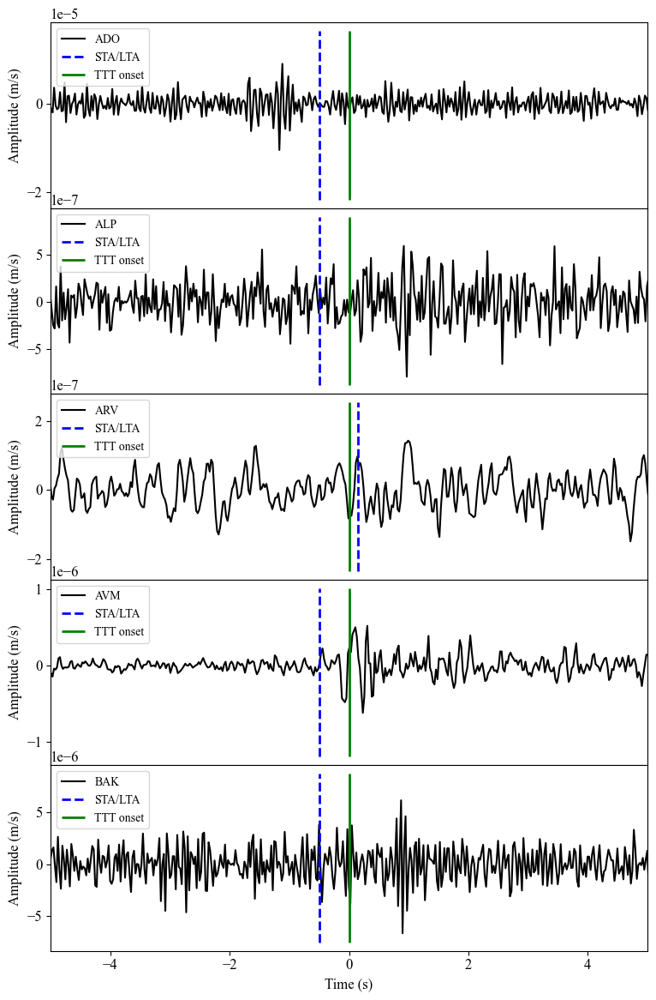

In [ ]:
from obspy.signal.trigger import recursive_sta_lta, trigger_onset

df= st_2[0].stats.sampling_rate

#put parameter here to slice signal

sig_shorts2 = []

# create a set of potentially usable traces
st_2i=st_2
st_2=obspy.Stream()

for ss in st_2i:
    ttt=ss.stats.t1
 
    # Now we slice the signal n seconds before theoretical travel time
    # and m second after theoretical travel time
    sig_short2 = ss.slice(ss.stats.starttime + ttt - 5, ss.stats.starttime +ttt + 5)
    sig_shorts.append(sig_short2)
    
    cft = recursive_sta_lta(sig_short2.data, int(.5 * df), int(4.5 * df))
    on_of = trigger_onset(cft,1.5, 0.5)
    #print(on_of)
    if len(on_of)>= 1 :  #avoid no detection (update: 2025.10.20)
        on_of_1= on_of[0,[0]]
        on_of_1= float(on_of_1/df)
        #print(on_of_1)
        on_of_1= on_of[0,[0]]
    #print(on_of_1)
    
        on_of_1= float(on_of_1[0]/df)
    #print(on_of_1)

        ss.stats.sta_lta_time=  ss.stats.t1 -5 + on_of_1 #Put on-off time in the obspy stream object, -5 because we trim signal 5 sec before t1
    #print (type(ss.stats.sta_lta_time))

        # add this trace to the "good" stream
        st_2.append(ss)
    else:
        print('Discarding ',tr.get_id())

#Plot random trace
fig4, ax4 = plt.subplots(len(st_2[0:5]), figsize=(8, 12), sharex=True)

for tr,axx in zip(st_2,ax4):
    axx.plot(tr.times()-tr.stats.t1, tr.data, color='black', label=tr.stats.station)
    ymin, ymax = axx.get_ylim()
    plt.rc('font', size=18)

    
    axx.vlines(tr.stats.sta_lta_time-tr.stats.t1, ymin, ymax, color='blue', linewidth=2, linestyle= '--', label='STA/LTA')
    axx.vlines(tr.stats.t1-tr.stats.t1, ymin, ymax, color='green', linewidth=2, label='TTT onset')
    axx.legend(loc='upper left', fontsize=10)
    axx.set_xlabel('Time (s)')
    axx.set_ylabel('Amplitude (m/s)')
    axx.set_xlim(-5,5)
    plt.tight_layout()
    #plt.savefig('Reference_EQ_onset_detection_1b.png')

fig4.subplots_adjust(wspace=0, hspace=0)

#fig4.savefig('38564031_target_ttt_sta-lta.png')



### 2.5. Signal to Noise Ratio (SNR)


Examine the signal quality by comparing the desire onset earthquake signal to the background noise level.
We compute the ratio of the power of the signal to the power of the background noise level.

$$
SNR = \frac{P_{signal}}{P_{noise}}
$$

In [ ]:
#####################################################
############# Sinal to noise ratio (SNR) ############
#####################################################

# save the SNR on the stream

# change so that you don't have to use t1, just grab it from the stream
for tr in st_2:
    t_snr=tr.stats.t1
    Sig = tr.slice (tr.stats.starttime + t_snr, tr.stats.starttime + t_snr + 2) #SIGNAL
    Noi = tr.slice (tr.stats.starttime + t_snr -3, tr.stats.starttime + t_snr -1) #NOISE
    SNR = (np.average(np.power(Sig,2)))/(np.average(np.power(Noi,2)))
    tr.stats.SNR = SNR

    #print('SNR:' + tr.stats.station)
    #print (SNR)

# 3. Plot pair of earthquake and the stations

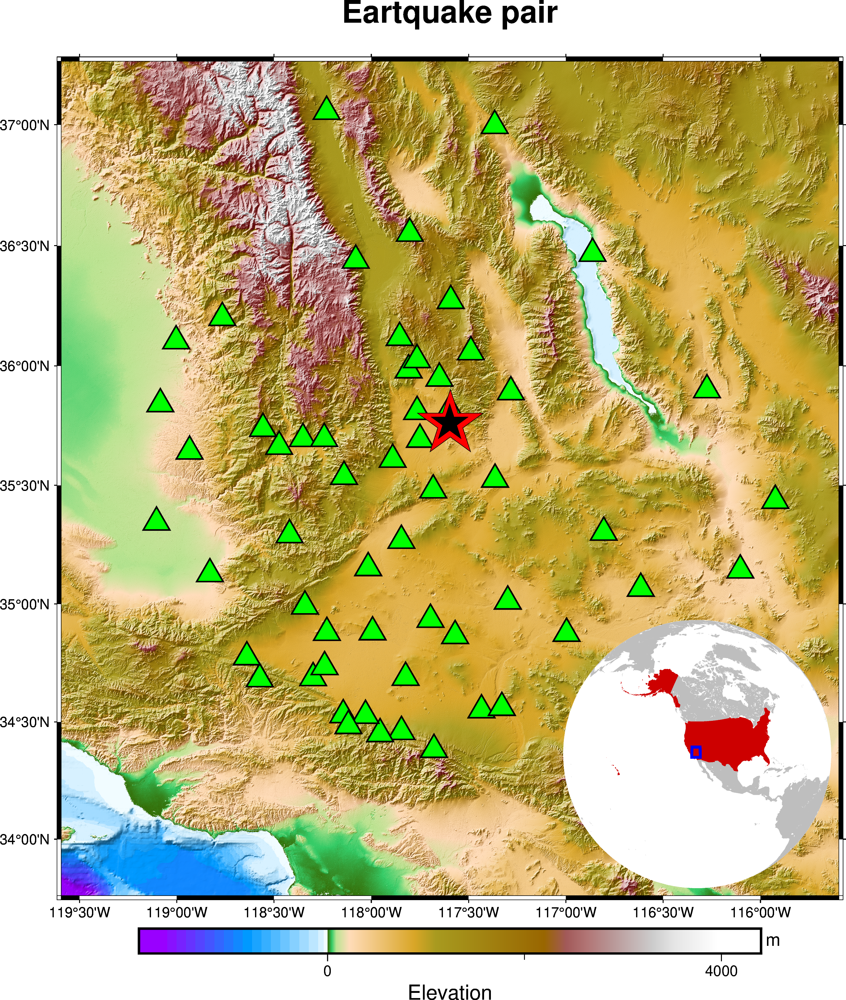

In [ ]:
import pygmt

x1 = eq.origins[0].longitude
y1 = eq.origins[0].latitude

x2 = eq_2.origins[0].longitude
y2 = eq_2.origins[0].latitude

## Generate  coordinates in the range for plotting


region = [x1-2.,x2+2.,y1-2.,y2+1.5]
fig = pygmt.Figure()
plt.rc('font', size=10)
fig.basemap(region=region, projection="M8i",  frame=['a', '+tEartquake pair'])
fig.coast(region=region, shorelines=True)

#Earth relief plot
grid = pygmt.datasets.load_earth_relief(
    resolution="03s", region=region, registration="gridline")
fig.grdimage(grid=grid, frame="a", projection="M8i", cmap="globe", shading=True)

#extract station coordinates from inventory
x_sta_dat = []
y_sta_dat = []

for net in invh:
    for sta in net:
        x_sta = sta.longitude
        x_sta_dat.append(x_sta)
        y_sta = sta.latitude
        y_sta_dat.append(y_sta)

     
fig.plot (x= x_sta_dat, y= y_sta_dat, style="t0.8c", fill='green', pen='1p', label='Station')


# plot 2019 Ridgecrest earthquake series
data = pd.read_csv('Ridgecrest_rata_2019_all_FIN.csv', delimiter =';')
lons = data.Lon
lats = data.Lat
depth= data.Depth
mag=data.Mag

#fig.plot(x=lons, y=lats, size=0.01 * (2**data.Mag.values),style='cc', color='red', pen='black',label='Ridgecrest Earthquake Series')

# plot earthquake pair
fig.plot(x=x1, y=y1, style="a1.8c", fill="red", pen="black", label='Target earthquake')
fig.plot(x=x2,y=y2,  style="a1.0c", fill="black", pen="black", label='Reference earthquake')


#fig.legend(position= "JBR+jBR+l4.8c+o0.2c+w7c", box=True) #BR = bottom right, l= spacing,o = offset, w=width
fig.colorbar(frame=["a4000f2000", "x+lElevation", "y+lm"])
#fig.savefig('Earthquake_pair_plot_1a.png')


#inset map

with fig.inset(position="jBR+w7.0c+o0.2c", margin=0, box=False):
    
    fig.coast( region="US", projection="G-117/35/?", land="grey", water="white", dcw="US+gred3")
    
    rectangle = [[x1-2.2,y2+2.2,x2+2.2,y1-2.2]]  #[[minlon, maxlat, maxlon, minlat]]

    fig.plot(data=rectangle, style="r+s", pen="2p,blue")

fig.show()

#fig.savefig('38564031_earthquake_pair_map.png')


# 4. Onset pick time correction

This section is to refine the pick time of onset detection between target and reference seismogram.
We do cross-correlation pick correction following Obspy xcorr_pick_correction.
The input are:
1. trace_1, time_pick_1, trace_2, time_pick_2,
2. Time to start CC window before pick times in seconds.
3. Time to end CC window after pick times in seconds.
4. Maximum lag/shift time tested during CC in seconds.

Result in: Correction time pick2_corr for pick2 pick time and corresponding correlation coefficient.

In [ ]:
import cross_correlation_function 
reload(cross_correlation_function) 


<module 'cross_correlation_function' from '/Users/madekris/Coherence_Based_Stress_Drops/cross_correlation_function.py'>

In [ ]:
for tr1 in st:
    # copy and normalize
    tr1c=tr1.copy() #trace 1 for cross-correlation
    tr1c.data=tr1c.data/np.max(np.abs(tr1c.data)) # trace 1  cc normalization

    # grab the trace for the reference earthquake
    # with the same ID
    tr2=st_2.select(id=tr1.get_id())
    if len(tr2)> 0:
        # if data exists, copy and normalize
        tr2=tr2[0]
        tr2c=tr2.copy() #trace 2 for cross-correlation
        tr2c.data=tr2c.data/np.max(np.abs(tr2c.data)) #trace 2 cc normalization
        
        if tr2.stats.SNR > 5:
            

            # do the xc by using the cross_correlation_function
      

            x_c = cross_correlation_function.calc_xc(UTCDateTime(tr1c.stats.starttime + tr1c.stats.sta_lta_time), tr1,
                            UTCDateTime(tr2c.stats.starttime + tr2c.stats.sta_lta_time), tr2, 2, 2, 1)

            # save xc in the original streams
            tr1.stats.xcmax=x_c[1]
            tr2.stats.t2=tr2.stats.sta_lta_time+x_c[0]
            print('t2 is:')
            print((tr2.stats.t2)) 
            print(x_c)
            
            

t2 is:
79.69344968072903
[-0.1499999999999999, 0.924073727375069]
t2 is:
72.90582957756418
[-0.25, 0.8457305137421104]
t2 is:
66.2881302271772
[-0.04999999999999993, 0.8093453642053904]
t2 is:
84.53694806886193
[-0.04999999999999993, 0.8058169513326683]
t2 is:
61.23466981492905
[-0.22499999999999998, 0.9181308056364234]
t2 is:
69.81414987437026
[0.050000000000000044, 0.6719081416176781]
t2 is:
74.77060377679716
[-0.04999999999999993, 0.9405257154446658]
t2 is:
84.40118133543979
[0.0, 0.9248212244335569]
t2 is:
85.60012964627818
[0.0, 0.9562182443922438]
t2 is:
84.6281212526988
[0.0, 0.4265676238183257]
t2 is:
73.30138636553754
[0.0, 0.7931251229395376]
t2 is:
85.01005750809395
[0.025000000000000133, 0.7032639137953525]
t2 is:
65.49467743804398
[-0.09999999999999998, 0.7455108478929455]
t2 is:
66.04293694087194
[-0.02499999999999991, 0.8791988041175455]
t2 is:
84.22698191427878
[-0.09999999999999998, 0.8419864203425952]
t2 is:
64.94349758592477
[-0.75, 0.9494976199510133]
t2 is:
62.2390

In [ ]:
recompute the snr for the reference earthquake

# 5. Final signal selection

In this section we select the final seismogram for phase-coherence by imposing the SNR and cross-correlation factor criteria.

### 5.1. Impose the criteria

In [ ]:
# decide on criteria
SNR1=10
SNR2=1
XCMIN=0.7

# decide what to pass, don't want all station
st1_use = obspy.Stream()

# consider each trace that we might include
for tr1 in st:
    tr2=st_2.select(id=tr1.get_id())
    

    # make sure the trace exists in the reference earthquake
    if len(tr2):
        tr2=tr2[0]

        # check some properties
        if tr2.stats.SNR>SNR2 and tr1.stats.SNR>SNR1:
            if 'xcmax' in tr1.stats.keys():
                if tr1.stats.xcmax > XCMIN:
                    st1_use.append(tr1)

print ('The signal passed those criteria are:')
print(st1_use)


The signal passed those criteria are:
21 Trace(s) in Stream:

CI.AVM..BHZ | 2019-07-07T10:36:45.721800Z - 2019-07-07T10:40:45.721800Z | 40.0 Hz, 9601 samples
...
(19 other traces)
...
CI.WRC2..BHZ | 2019-07-07T10:36:45.719500Z - 2019-07-07T10:40:45.719500Z | 40.0 Hz, 9601 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


### 5.2. Plot the signal comparison

This plot is to compare two waveform (target and reference earthquake) at the recorded stations. 

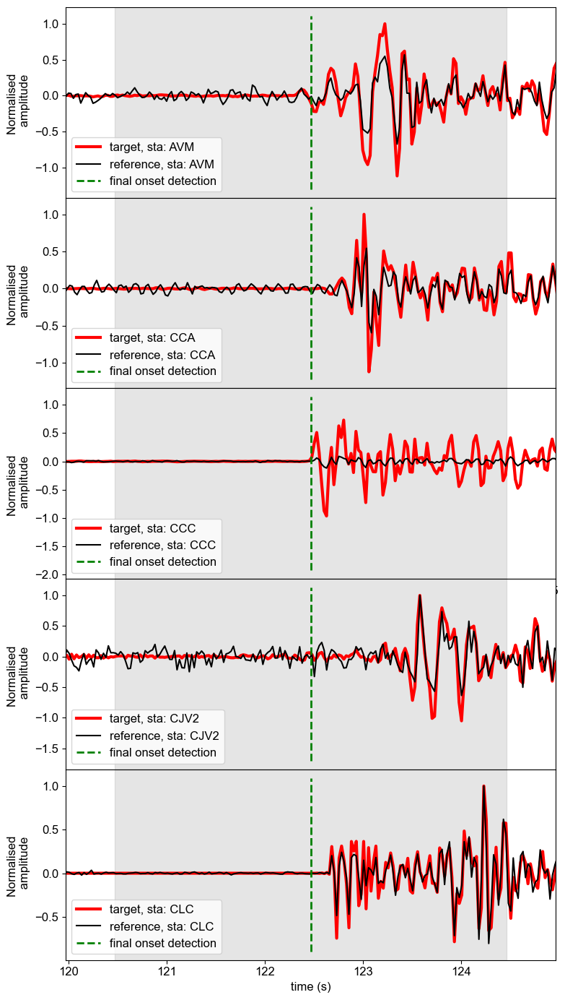

In [ ]:
fig_cc, ax_cc = plt.subplots(len(st1_use[0:5]), figsize=(8, 14))
plt.rc('font', size=12)

for tr1,tr2,ax in zip(st1_use,st_2,ax_cc):
    tr2 = st_2.select(id=tr1.get_id())


    
    ax.plot(tr1.times()-0.05+tr2[0].stats.t2,tr1.data/np.max(tr1.data),color='red', linewidth=3.0,label='target, sta: '+ (tr1.stats.station))
    ax.plot(tr2[0].times()+tr2[0].stats.t2,tr2[0].data/np.max(tr2[0].data),'black', label='reference, sta: '+ (tr1.stats.station))
    ymin, ymax = ax.get_ylim()
    
    ax.vlines(tr2[0].stats.t2+tr2[0].stats.t2, ymin, ymax, color='green', linewidth=2, linestyle= '--',label='final onset detection' )
    ax.legend(loc='lower left', fontsize=12)
    ax.set_xlabel('time (s)')
    ax.set_ylabel('Normalised \n amplitude')
    ax.axvspan((tr2[0].stats.t2+tr2[0].stats.t2)-2.0,(tr2[0].stats.t2+tr2[0].stats.t2)+2.0,color='grey',alpha=0.2) #mark the cross correlation duration
    ax.set_xlim((tr2[0].stats.t2+tr2[0].stats.t2)-2.5,(tr2[0].stats.t2+tr2[0].stats.t2)+2.5)
    plt.tight_layout()
   

fig_cc.subplots_adjust(wspace=0, hspace=0)
#fig_cc.savefig('38564031_signal_comparison.png')



# 6. Phase Coherence

This section calculate the interstation phase coherence 


Input parameters are:

st1 : the final selected target earthquake seismic waveforms, full range of frequencies.

st2 : the final selected reference earthquake seismic waveforms, full range of frequencies.

trange : time window segment to ectract for spectral analysis in second.

mk1 : final high-precision arrival time pic for the target earthquake.

mk2 : final high-precision arrival time pic for the reference earthquake.

nsint : noise interval.

tpr : the method used to taper the time-series window edges before moving into the frequency domain.



The cross spectra have shape
(28, 21, 1)
Fall-off frequency is:
9.201238420444954


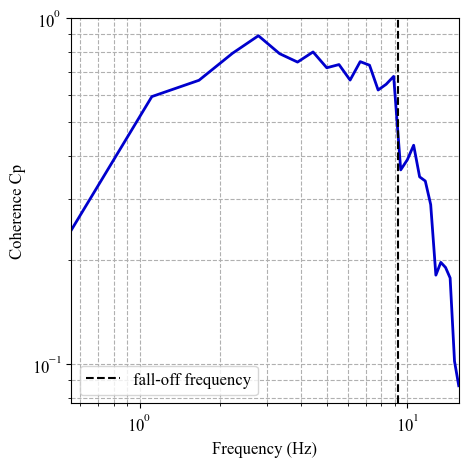

In [ ]:
import phscoh as phscoh
reload (phscoh)

#import testappstf as testappstf

# compute the cross spectra
xc=phscoh.calcxc(st1_use,st_2,trange=[0,1.8],mk1='sta_lta_time',mk2='t2',nsint=2,tpr='cosine')

# xc is an object which contains the cross spectra
print('The cross spectra have shape')
print(xc.xc.shape)

# and then calculate the moveout and coherence from the cross-spectra
xc.calcmvout()
xc.cpfromr()

# and finally we can pick a falloff frequencz, but note this doesnät work perfectlz
xc.pickffreq()

# can plot the moveout or coherence
fig = plt.figure(figsize=(5, 5))

plt.rcParams['font.family'] = 'Times New Roman'
plt.plot(xc.freq,xc.Cp,linewidth=2.0, color='mediumblue')
plt.xscale('log')
plt.yscale('log')

plt.xlim(min(xc.freq), max(xc.freq))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Coherence Cp')
plt.grid(True, which= 'both', ls='--')
plt.axvline(xc.ffbest,color='black',linestyle='--',label='fall-off frequency')
plt.legend()
#plt.savefig('38564031_phase_coherence_2.png')

print('Fall-off frequency is:')
print (xc.ffbest)



In [ ]:
### Save coherence 

#np.savez_compressed('38475007_coherence_file.npz', coherence = xc.xc, frequency = xc.freq, ff=xc.ffbest)

# 7. Stress drop estimation

### 7.1. Input the seismic wave velocity

In [ ]:
# the P wave velocity (vp)
#vp= 6300 # Hauksson and Unruh (2007); although I am not really sure which value Trugman took from this paper.
#vp1=5320 # at depth 2.5 km (White et al (2021))
#vp2=6482 # average at depth 0 - 10 km (White et al (2021))

# the shear wave velocity (vs)
#vs= vp/1.7 # Hauksson and Unruh (2007), section 5.1; average Vp/Vs=1.73 from: White et al (2021)
#vs=3200. # (Bindi et al., 2023a, 2023b). 
vs = 3500 # Stress drop validation study, Abercrombie & Baltay (2025)
vp = 1.7 * vs
vr = 0.9 * vs 
print(vr)
print(vp)
print(vr/vp)

3150.0
5950.0
0.5294117647058824


### 7.2. Estimate the rupture radius from fall-off frequency

Now we can estimate the diameters from these values.  

To estimate the rupture radius from the falloff frequencies we use 

$$f_{fall} = p_f \frac{V_p}{D}$$

$$D = p_f \frac{V_p}{f_{fall}}$$

$$ r = \frac{D}{2} $$
Whre r is rupture radius, this comes from William et al (2019).

pf is the proportionaity factor, derived from synthetics (Hawthorne, 2019) to better calibrate between fall-off frequency and rupture diameter.

In [ ]:
## Fall-off frequency
ff= xc.ffbest  

# Since we change our vs = 3500 m/s as the stress drop validation study use, then the proportionality factor (pf) also change.

pf = 0.77 #proportionality factor
D = (pf * vp) / ff
r_ff = D/2  # rupture radius

print('Rupture radius (m):')
print(r_ff)

Rupture radius (m):
248.96105234160686


### 7.3. Stress drop

Finally, we can estimate the stress drops from the moments and diameters.  To estimate the stress drops, we use: 

$${\Delta \tau} = (7/16) \frac{Mo}{r^3}$$

This comes from Shearer (2019), equation 9.44

In [ ]:
M0 = 1.04E+14 # Seismic moment in Nm  
coeff_Eshelby = 7/16 #Eshelby coefficient for circular crack earthquake model
nom = (coeff_Eshelby * M0) #nominator
denom = np.power(np.array(r_ff), 3) #denominator
delta_tau_ff = np.divide(nom, denom) #Stress drop in Pa
delta_tau_ff_MPa= delta_tau_ff * 1e-6 #stress drop in MPa
print('Coherence-based stress drop in MPa:')
print(delta_tau_ff_MPa)

Coherence-based stress drop in MPa:
2.948608841958528
